In [1]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Audio
from skimage.io import imread
from scipy import signal
from patchify import patchify, unpatchify
import math
import shutil
import os

import argparse
import logging
import os
import numpy as np
from numpy import fft
from patchify import patchify, unpatchify
from math import log10, sqrt, cos, sin, pi
from utils.data_loading import BasicDataset
from math import cos, sin, pi

In [13]:
def sig(img):
    new_arr = np.zeros(img.shape)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            if img[i,j]>=0.0:
                new_arr[i,j] = 0
            else:
                new_arr[i,j] = 255
    return new_arr

In [3]:
def high_edge(img):
    Xshift = fft.fftshift(fft.fft2(img))
    filt = np.ones((1760,1760))
    w=64
    for i in range(881-w//2,881+w//2):
        for j in range(881-w//2,881+w//2):
            filt[i,j] = 0
    img_filt = np.multiply(Xshift,filt)
    img_filt = fft.fftshift(img_filt)
    img = fft.ifft2(img_filt)
#     double_lis = np.array([np.abs(img),np.angle(img)*127.5/pi+sig(np.angle(img))])
#     double_lis = double_lis.transpose((1,2,0))
    double_lis = np.array([np.real(img),np.imag(img)])
    double_lis = double_lis.transpose((1,2,0))
    return double_lis

#========================================================================================================
def low_edge(img):
    Xshift = fft.fftshift(fft.fft2(img))
    filt = np.zeros((1760,1760))
    
    w=176
    for i in range(881-w//2,881+w//2):
        for j in range(881-w//2,881+w//2):
            filt[i,j] = 1
    w=64
    for i in range(881-w//2,881+w//2):
        for j in range(881-w//2,881+w//2):
            filt[i,j] = 0
    img_filt = np.multiply(Xshift,filt)
    img_filt = fft.fftshift(img_filt)
    img = fft.ifft2(img_filt)
#     double_lis = np.array([np.abs(img),np.angle(img)*127.5/pi+sig(np.angle(img))])
#     double_lis = double_lis.transpose((1,2,0))
    double_lis = np.array([np.real(img),np.imag(img)])
    double_lis = double_lis.transpose((1,2,0))    
    return double_lis

In [4]:
def high_imag(img):
    Xshift = fft.fftshift(fft.fft2(img))
    filt = np.ones((1760,1760))
    w=64
    for i in range(881-w//2,881+w//2):
        for j in range(881-w//2,881+w//2):
            filt[i,j] = 0
    img_filt = np.multiply(Xshift,filt)
    img_filt = fft.fftshift(img_filt)
    img = fft.ifft2(img_filt)
    lis = np.imag(img)
    return lis

#========================================================================================================
def low_imag(img):
    Xshift = fft.fftshift(fft.fft2(img))
    filt = np.zeros((1760,1760))
    
    w=176
    for i in range(881-w//2,881+w//2):
        for j in range(881-w//2,881+w//2):
            filt[i,j] = 1
    w=64
    for i in range(881-w//2,881+w//2):
        for j in range(881-w//2,881+w//2):
            filt[i,j] = 0
    img_filt = np.multiply(Xshift,filt)
    img_filt = fft.fftshift(img_filt)
    img = fft.ifft2(img_filt)
    lis = np.imag(img)  
    return lis

In [5]:
def cut_center(img):
    Xshift = fft.fftshift(fft.fft2(img))
    w = 176
    return np.real(Xshift)[881-w//2:881+w//2,881-w//2:881+w//2]+1j*np.imag(Xshift)[881-w//2:881+w//2,881-w//2:881+w//2]

In [20]:
for i in range(1,1281):
    img = np.load('./image/image_origin/high/%04d.npy'%i)

    h_edge = high_edge(img)
    l_edge = low_edge(img)
# #     path_high = './image/image_double_cart_64/real/high/%04d.npy'%i                                            
# #     np.save(path_high,h_edge)
# #     path_low = './image/image_double_cart_64/real/low/%04d.npy'%i
# #     np.save(path_low,l_edge) 
    
#     path_high = './image/image_double_cart_64/real/high/%04d.npy'%i
#     np.save(path_high,h_edge[:,:,0])
#     path_low = './image/image_double_cart_64/real/low/%04d.npy'%i
#     np.save(path_low,l_edge[:,:,0])
    
    path_high = './image/image_double_cart_64/real/high/%04d.npy'%i
    np.save(path_high,h_edge[:,:,0])
    path_low = './image/image_double_cart_64/real/low/%04d.npy'%i
    np.save(path_low,l_edge[:,:,0])
    print(i)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


patchfy and small trainset maker

In [14]:
def smallest(arr):
    sp = arr.shape[0:2]
    img = np.zeros(sp)
    img = arr[:,:]
    return np.min(img)

def largest(arr):
    sp = arr.shape[0:2]
    img = np.zeros(sp)
    img = arr[:,:]
    return np.max(img)

In [15]:
patch_size = (64,64)
training_amount = 200
final_amount = 100000
div1 = 32
div2 = 32
mini_div = 0
low_set = np.empty([final_amount,64,64], dtype = float)
high_set = np.empty([final_amount,64,64], dtype = float)

count = 0
for i in range(training_amount):
    if count >= final_amount:
        break
    index = 400 + i*10
    read_path_high = "./image/image_origin/high/%04d.npy" %index
    read_path_low = "./image/image_origin/low/%04d.npy" %index
    
    high_img = np.load(read_path_high)
    low_img = np.load(read_path_low)
#     high_patches = np.squeeze(patchify(high_img,patch_size),axis=2)
#     low_patches = np.squeeze(patchify(low_img,patch_size),axis=2)
    high_patches = patchify(high_img,patch_size)
    low_patches = patchify(low_img,patch_size)

    
    for j in range(high_patches.shape[0]//div1):
        if count >= final_amount:
            break
        for k in range(high_patches.shape[1]//div2):
            ind1 = div1*j
            ind2 = div2*k
            high_patch = high_patches[ind1,ind2,:]
            low_patch = low_patches[ind1,ind2,:]
            if count >= final_amount:
                break
            if largest(high_patch)-smallest(high_patch) > mini_div and count < final_amount:
                high_set[count] = high_patch
                low_set[count] = low_patch
                count+=1
                
np.save("./npy/high_plain.npy", high_set)
np.save("./npy/low_plain.npy", low_set)
print(high_set.shape)

(100000, 64, 64)


In [2]:
# low = np.load("./npy/low_double_cart_real_64.npy")
# high = np.load("./npy/high_double_cart_real_64.npy")
# low = np.load("./npy/low_double_polar_abs_64.npy")
# high = np.load("./npy/high_double_polar_abs_64.npy")
# low = np.load("./npy/high_edge_image.npy")
# high = np.load("./npy/low_edge_image.npy")
# low = np.load("./npy/low_edge_real.npy")
# high = np.load("./npy/high_edge_real.npy")
high = np.load("./npy/high_ori.npy")
low = np.load("./npy/low_ori.npy")

In [3]:
print(np.max(low),np.min(low))

238.52396684257565 0.015159366836773566


In [4]:
# shutil.rmtree('./data/data_double_cart_64/real/high/')
# os.mkdir('./data/data_double_cart_64/real/high/')
# shutil.rmtree('./data/data_double_cart_64/real/low/')
# os.mkdir('./data/data_double_cart_64/real/low/')
# shutil.rmtree('./data/data_double_polar_64/abs/high/')
# os.mkdir('./data/data_double_polar_64/abs/high/')
# shutil.rmtree('./data/data_double_polar_64/abs/low/')
# os.mkdir('./data/data_double_polar_64/abs/low/')
shutil.rmtree("./data/data_image_origin/low/")
os.mkdir("./data/data_image_origin/low/")
shutil.rmtree("./data/data_image_origin/high/")
os.mkdir("./data/data_image_origin/high/")
# shutil.rmtree("./data/data_nature/low/")
# os.mkdir("./data/data_nature/low/")
# shutil.rmtree("./data/data_nature/high/")
# os.mkdir("./data/data_nature/high/")

In [5]:
sam_num = 4000
offset = 74
for i in range(sam_num):
    k=i+1
    index = (100000//sam_num*i + offset) % 100000
    low_p = low[index]
    high_p = high[index]
#     path_high = "./data/data_nature/high/%04d.npy"%k
#     path_low = "./data/data_nature/low/%04d.npy"%k
#     path_high = "./data/data_double_polar_64/abs/high/%04d.npy"%k
#     path_low = "./data/data_double_polar_64/abs/low/%04d.npy"%k
    path_high = "./data/data_image_origin/high/%04d.npy"%k
    path_low = "./data/data_image_origin/low/%04d.npy"%k
#     path_high = "./data/data_double_cart_64/real/high/%04d.npy"%k
#     path_low = "./data/data_double_cart_64/real/low/%04d.npy"%k
    np.save(path_high, high_p)
    np.save(path_low, low_p)

In [9]:
t = high[100,:,:]
print(np.max(t))

25.0


In [54]:
edge = np.load('./image/image_double_polar_64/abs/low/0600.npy')

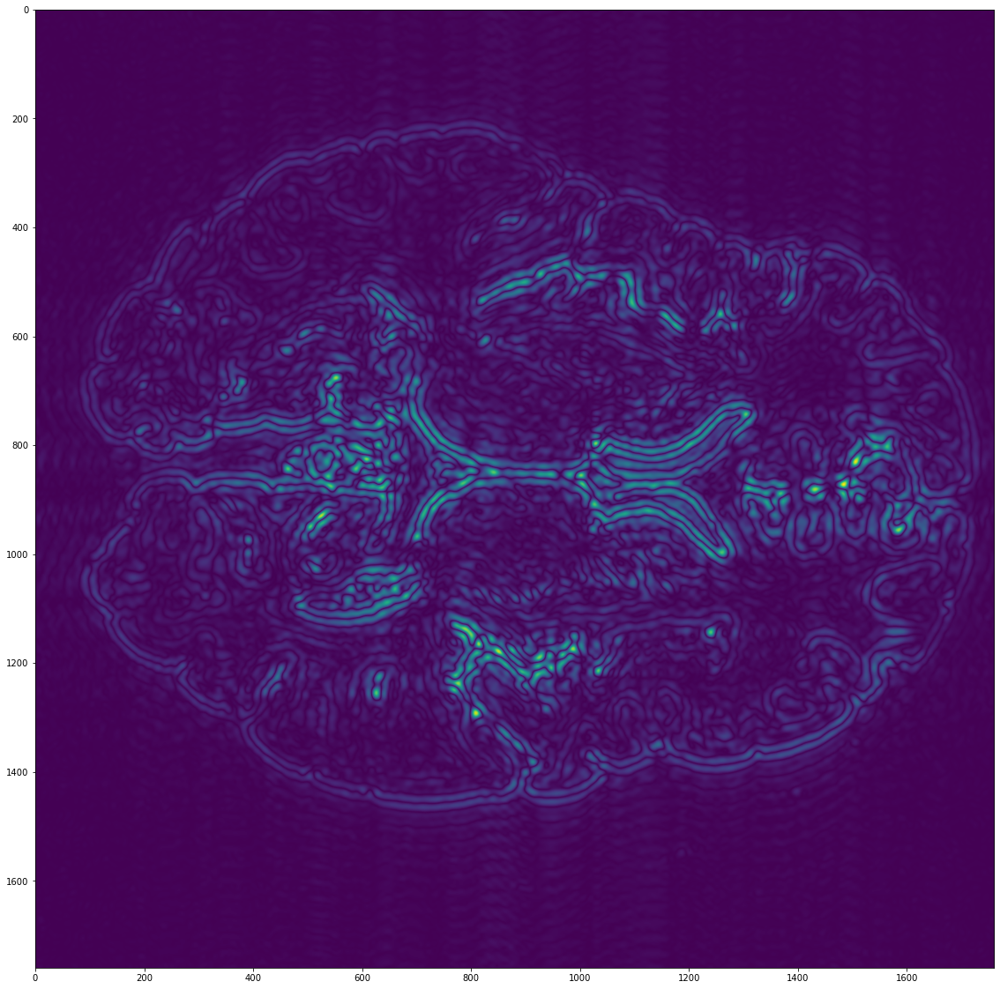

In [55]:
plt.figure(figsize=(20,20))
plt.imshow(edge)

In [11]:
from scipy.io import loadmat

In [21]:
a = loadmat('zp.mat')

In [22]:
b = a['xzp']

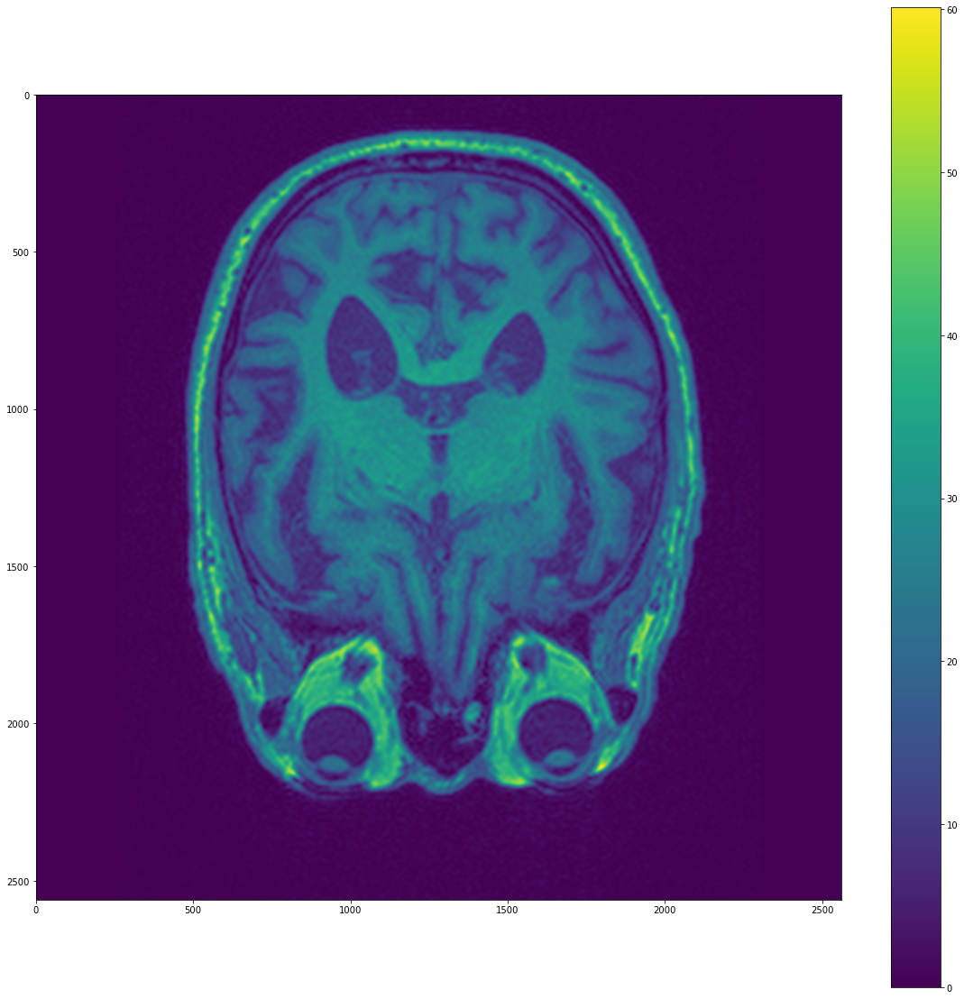

In [23]:
plt.figure(figsize=(20,20))
plt.imshow(abs(b))
plt.colorbar()

In [24]:
d = plt.imread('new_edge_pred.jpg')

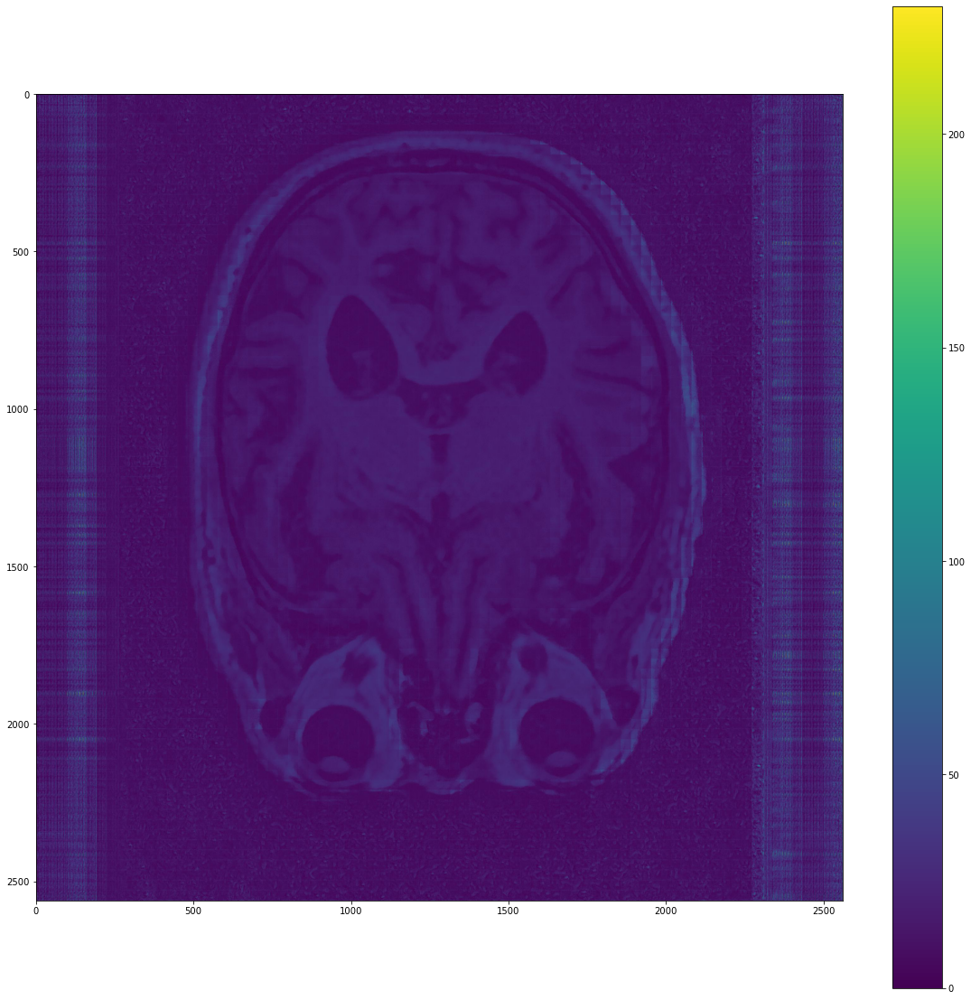

In [28]:
plt.figure(figsize=(20,20))
plt.imshow(d)
plt.colorbar()

In [3]:
img = abs(np.load('data_img.npy'))
# h_edge = high_imag(img)
# l_edge = low_imag(img) 
# #     path_high = './image/image_double_cart_64/real/high/%04d.npy'%i                                            
# #     np.save(path_high,h_edge)
# #     path_low = './image/image_double_cart_64/real/low/%04d.npy'%i
# #     np.save(path_low,l_edge) 

# path_high = './image/image_double_cart_64/imag/high/%04d.npy'%i                                            
# np.save(path_high,h_edge)
# path_low = './image/image_double_cart_64/imag/low/%04d.npy'%i
# np.save(path_low,l_edge)
# #     path_high = './image/image_cart_double_64/imag/high/%04d.npy'%i
# #     np.save(path_high,h_edge[:,:,1])
# #     path_low = './image/image_cart_double_64/imag/low/%04d.npy'%i
# #     np.save(path_low,l_edge[:,:,1])
# print(i)

In [7]:
print(np.max(img))

60.15769517606066


In [19]:
from scipy.io import loadmat
img = loadmat('./Mat/xzp.mat')['xzp']

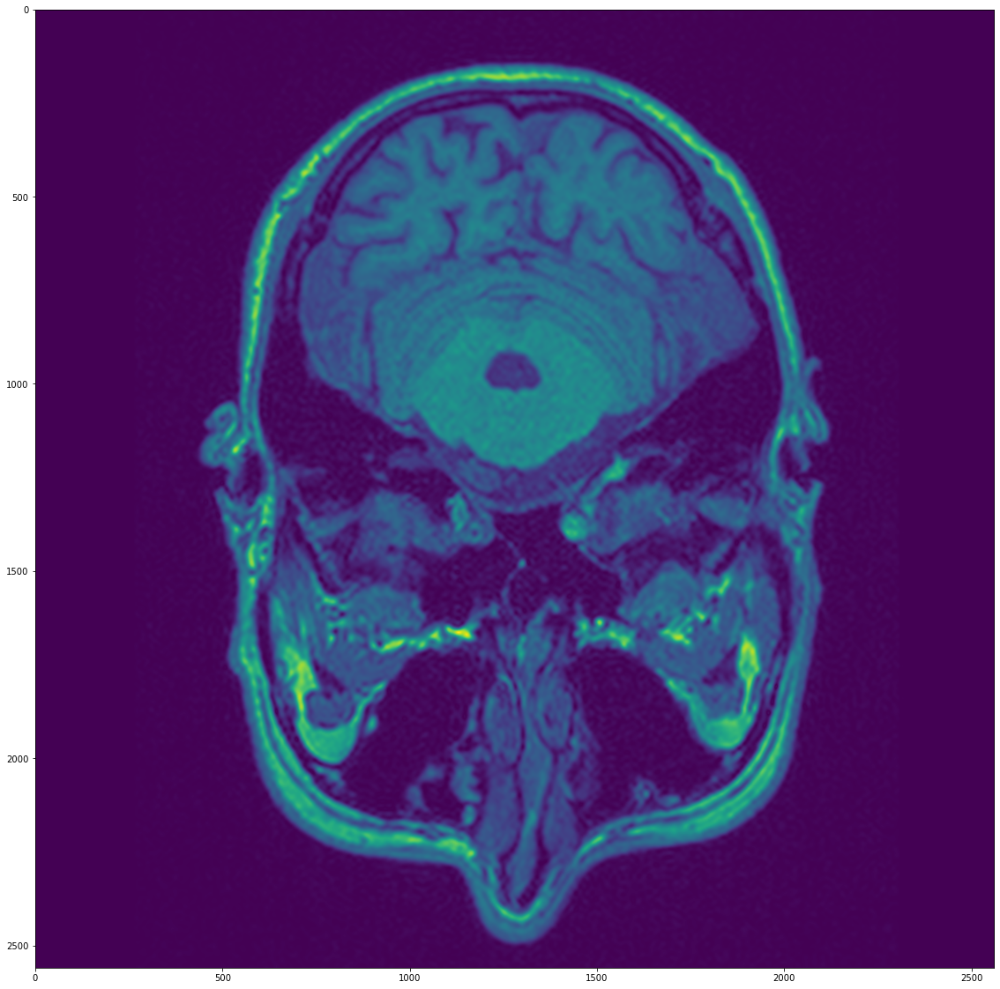

In [21]:
plt.figure(figsize=(20,20))
plt.imshow(abs(img))

# fft_img = fft.fftshift(fft.fft2(img))
# fft_padding = np.zeros((2560,2560))
# fft_padding[1281-128:1281+128,1281-128:1281+128]=fft_img
# img_pad = fft.ifft2(fft.fftshift(fft_padding))
# plt.figure(figsize=(20,20))
# plt.imshow(abs(img_pad))

636


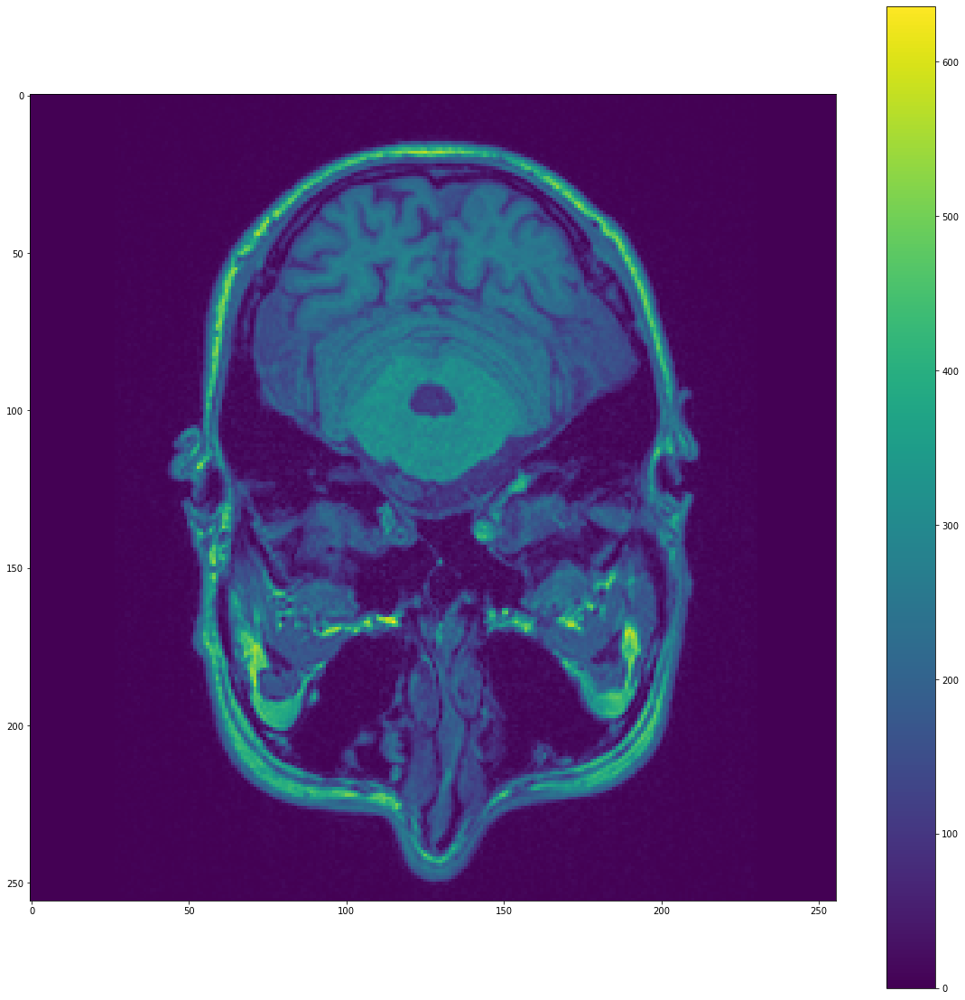

In [34]:
from scipy.io import loadmat
img = loadmat('./Mat/new_brain.mat')['img']
print(np.max(img))
plt.figure(figsize=(20,20))
plt.imshow(abs(img))
plt.colorbar()

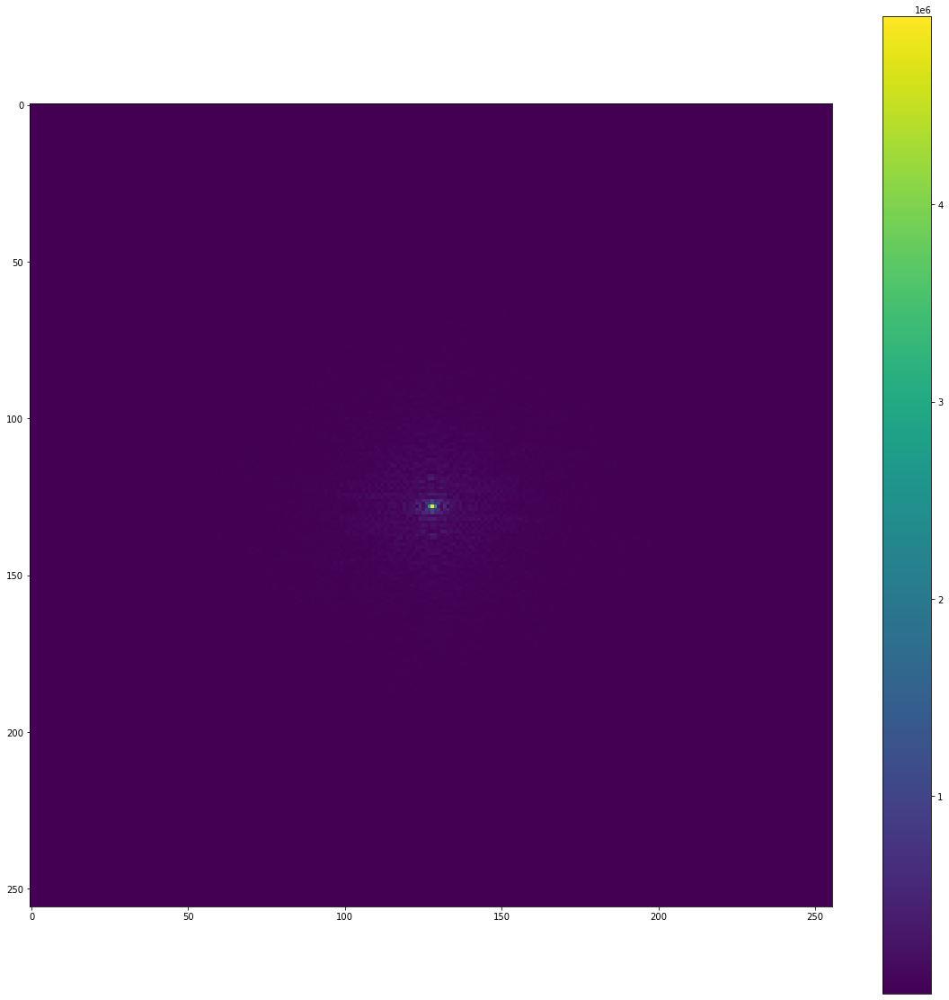

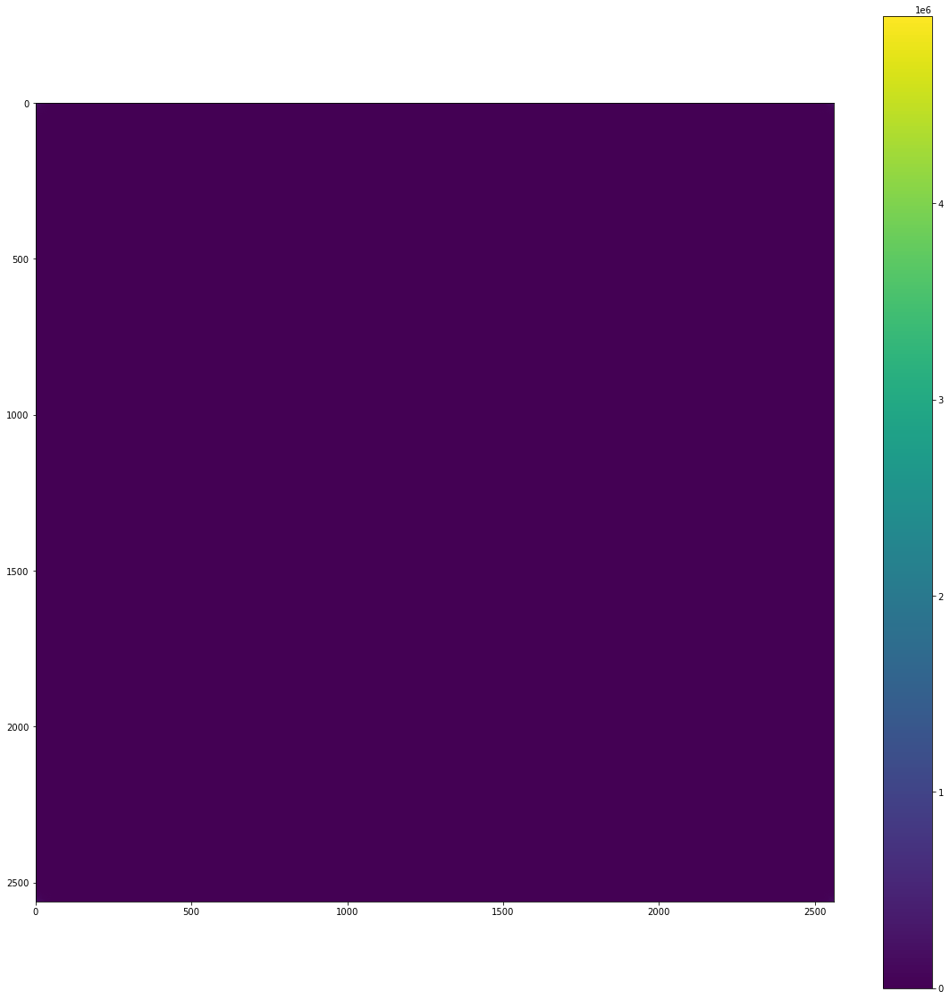

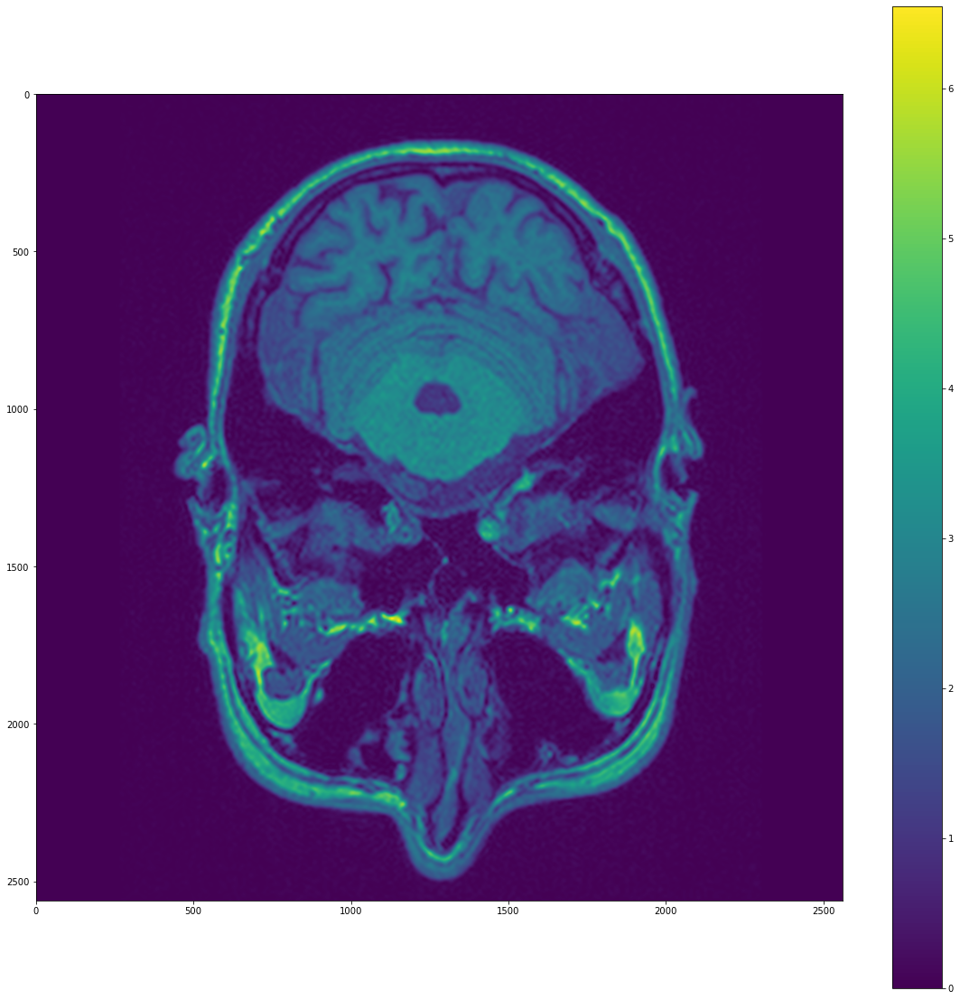

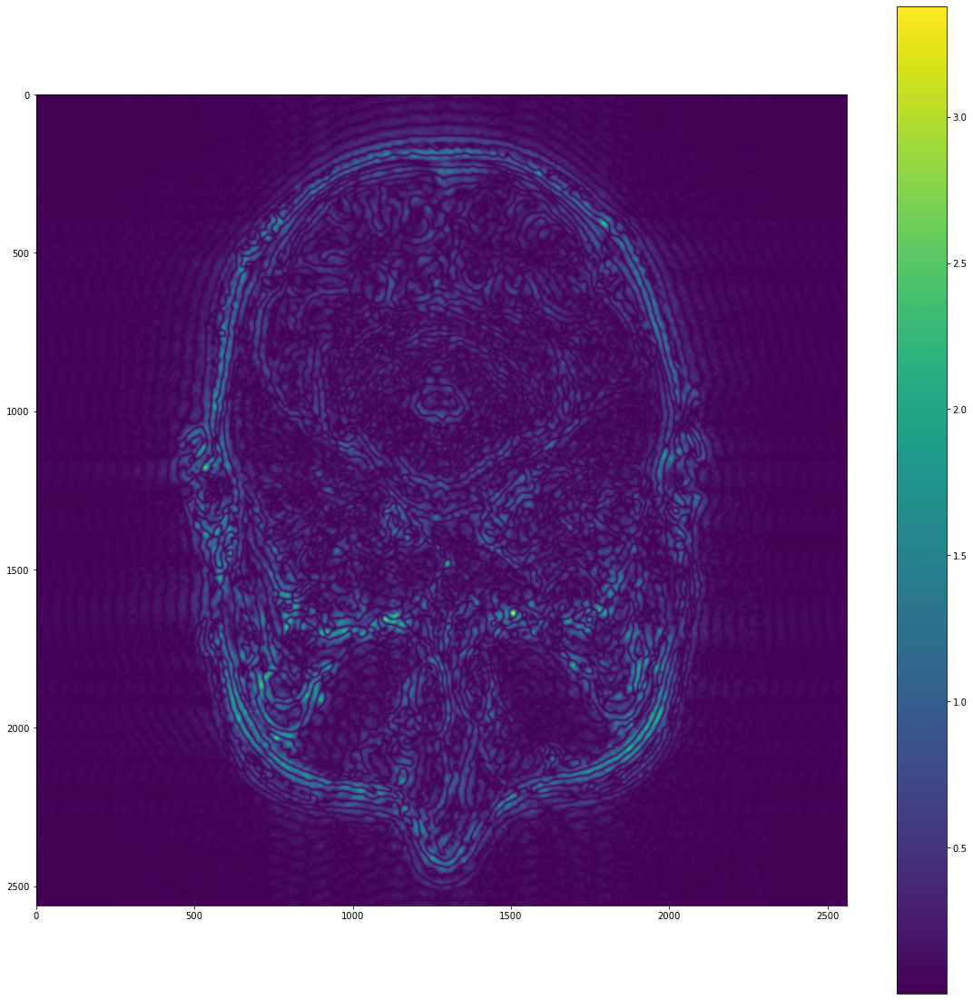

In [37]:
fft_img = fft.fftshift(fft.fft2(img))
plt.figure(figsize=(20,20))
plt.imshow(abs(fft_img))
plt.colorbar()
fft_padding = np.zeros((2560,2560),dtype=complex)
fft_padding[1281-128:1281+128,1281-128:1281+128]=fft_img

fft_edge = fft_padding.copy()
fft_edge[1281-32:1281+32,1281-32:1281+32] = np.zeros((64,64),dtype=complex)

fft_padding = fft.fftshift(fft_padding)
fft_edge = fft.fftshift(fft_edge)

plt.figure(figsize=(20,20))
plt.imshow(abs(fft_padding))
plt.colorbar()

img_new = fft.ifft2(fft_padding)
img_edge = fft.ifft2(fft_edge)

plt.figure(figsize=(20,20))
plt.imshow(abs(img_new))
plt.colorbar()

plt.figure(figsize=(20,20))
plt.imshow(abs(img_edge))
plt.colorbar()

In [38]:
img_new = img_new/np.max(abs(img_new))*255

False


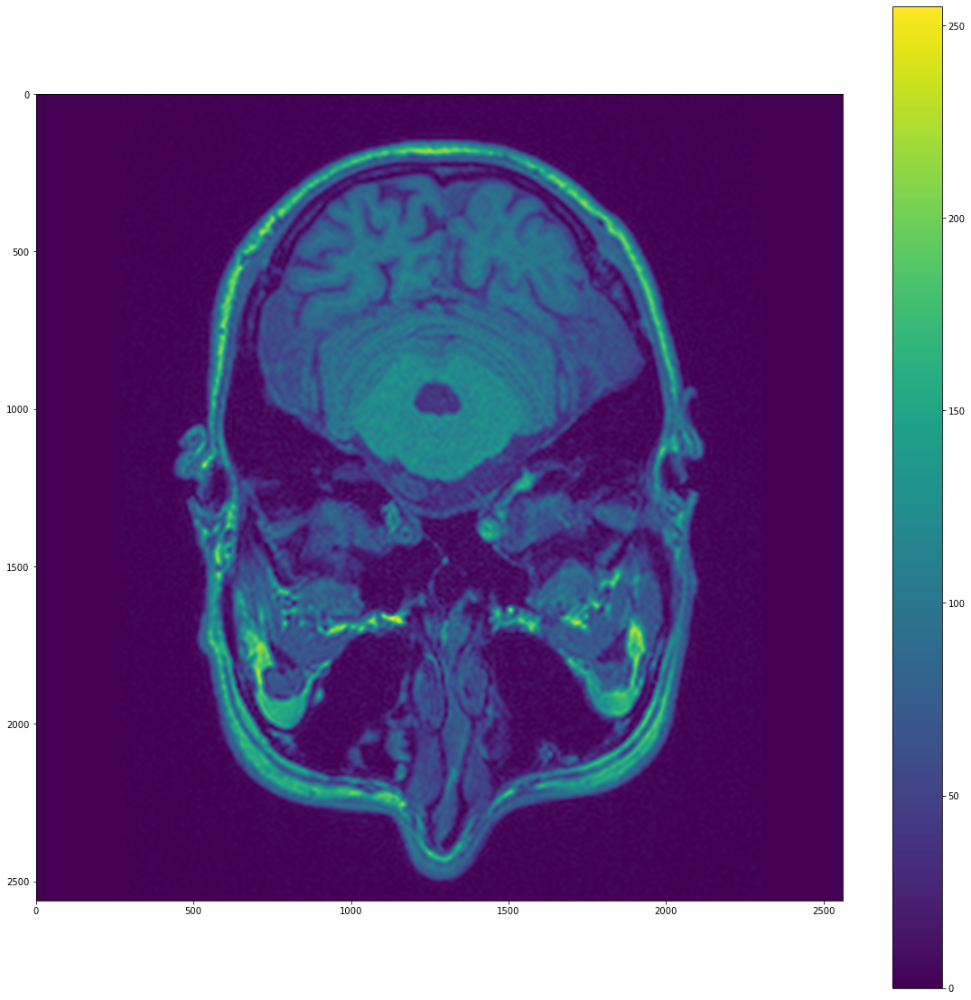

In [43]:
plt.figure(figsize=(20,20))
plt.imshow(abs(img_new))
plt.colorbar()
print(np.max(abs(img_new))>255.0)

np.save('./T2_data/new_image.npy',img_new)

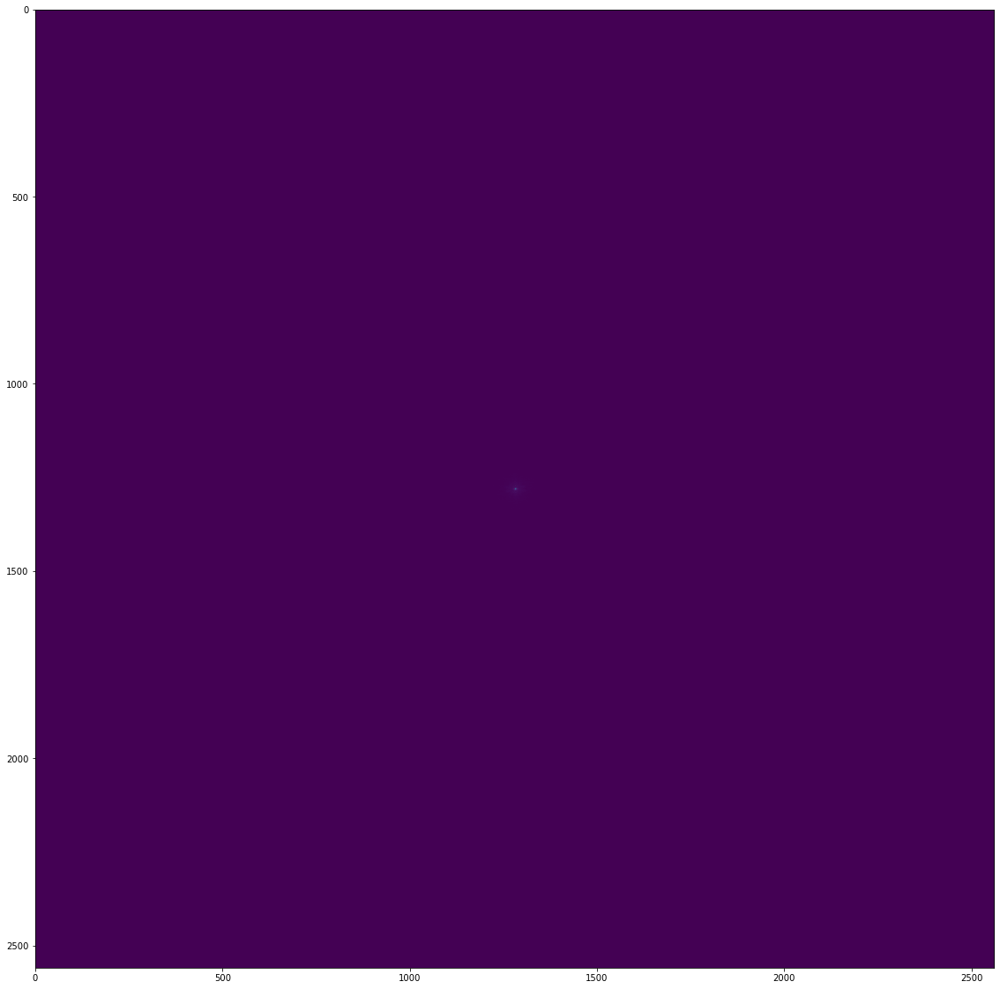

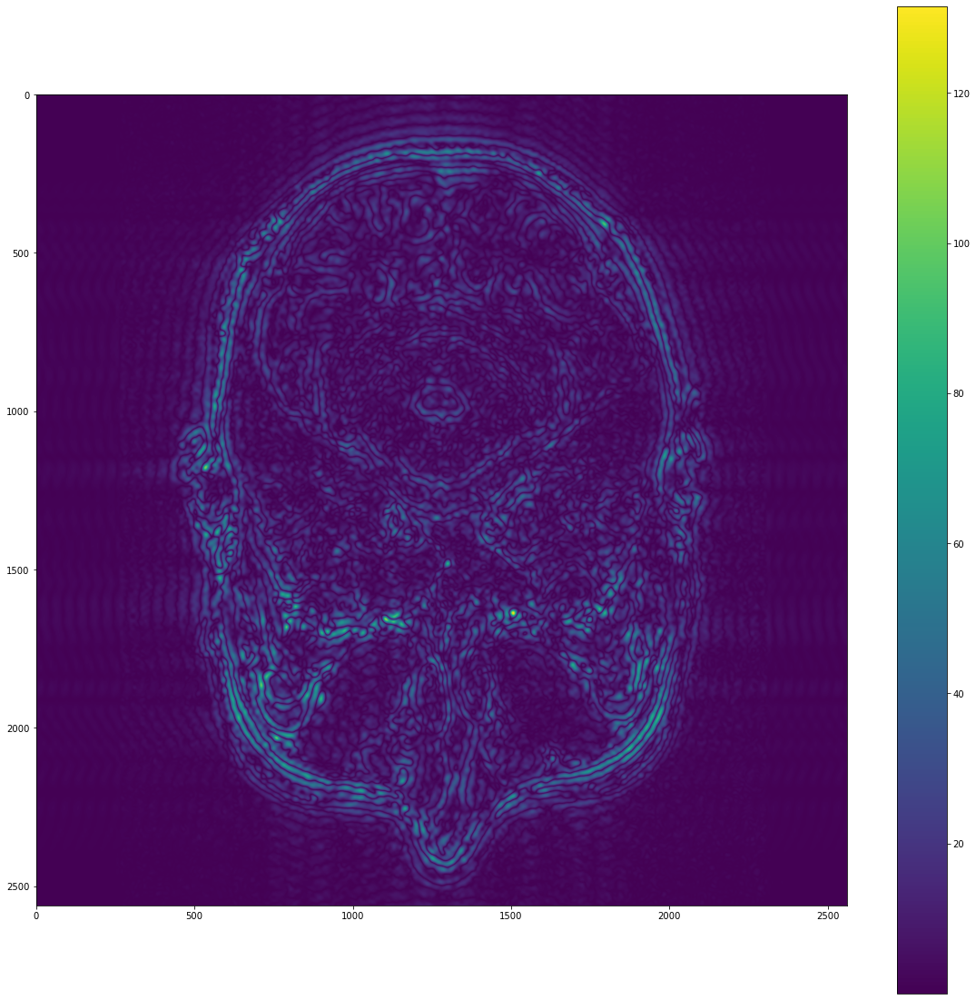

In [49]:
fft_img = fft.fftshift(fft.fft2(img_new))
plt.figure(figsize=(20,20))
plt.imshow(abs(fft_img))
fft_img[1281-32:1281+32,1281-32:1281+32] = np.zeros((64,64),dtype=complex)
fft_img = fft.fftshift(fft_img)
edge_img = fft.ifft2(fft_img)
plt.figure(figsize=(20,20))
plt.imshow(abs(edge_img))
plt.colorbar()

np.save('./T2_data/new_edge.npy',edge_img)

In [61]:
def psnr(original, compressed):
    mse = np.mean((original - compressed) ** 2)
    if(mse == 0):
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr
def bounds_hzf(upleft, hunit, wunit):
    up = upleft[0]
    left = upleft[1]
    down = up + hunit
    right = left + wunit
    return up, down, left, right
def getdeno_hzf(hbound, wbound, hlocate, wlocate, ratio):
    hdist = min(hlocate+1, hbound-hlocate)
    wdist = min(wlocate+1, wbound-wlocate)
    mulhw = hdist*wdist
    return min(mulhw, min(hdist,wdist)*ratio, ratio**2)
def patchify(img, hsize, wsize, hstep, wstep, goback=0):  # goback=0 means 12->23->34; goback=1 means 12->23->34->41.
    height, width = img.shape
    if not goback:
        hamount, wamount = int((height-hsize)/hstep)+1, int((width-wsize)/wstep)+1
        all_patches = np.zeros((hamount, wamount, hsize, wsize))
        for i in range(0, hamount):
            for j in range(0, wamount):
                u, d, l, r = bounds_hzf((i*hstep, j*wstep), hsize, wsize)
                all_patches[i, j, :, :] = img[u:d, l:r]
    else:
        newh, neww = height+hsize-hstep, width+wsize-wstep
        extend_img = np.zeros((newh, neww))
        extend_img[0:height, 0:width] = img[:, :]
        extend_img[height:newh, 0:width] = img[0:(newh-height), :]
        extend_img[0:height, width:neww] = img[:, 0:(neww-width)]
        extend_img[height:newh, width:neww] = img[0:(newh-height), 0:(neww-width)]
        hamount, wamount = int(height/hstep), int(width/wstep)
        all_patches = np.zeros((hamount, wamount, hsize, wsize))
        for i in range(0, hamount):
            for j in range(0, wamount):
                u, d, l, r = bounds_hzf((i*hstep, j*wstep), hsize, wsize)
                all_patches[i, j, :, :] = extend_img[u:d, l:r]
    return all_patches

def unpatchify(pch, hsize, wsize, hstep, wstep, goback=0):  # goback=0 means 12->23->34; goback=1 means 12->23->34->41.
    hamount, wamount = pch.shape[0], pch.shape[1]
    if not goback:
        height, width = int((hamount-1)*hstep+hsize), int((wamount-1)*wstep+wsize)
        merged_img = np.zeros((height, width))
        for i in range(0, hamount):
            for j in range(0, wamount):
                u, d, l, r = bounds_hzf((i*hstep, j*wstep), hsize, wsize)
                merged_img[u:d, l:r] = merged_img[u:d, l:r] + pch[i, j, :, :]
    else:
        height, width = int(hamount*hstep), int(wamount*wstep)
        hamount_true, wamount_true = hamount-int(hsize/hstep)+1, wamount-int(wsize/wstep)+1
        merged_img = np.zeros((height, width))
        for i in range(0, hamount_true):
            for j in range(0, wamount_true):
                u, d, l, r = bounds_hzf((i*hstep, j*wstep), hsize, wsize)
                merged_img[u:d, l:r] = merged_img[u:d, l:r] + pch[i, j, :, :]
    
    blockh, blockw, ratio = int(height/hstep), int(width/wstep), int(hsize/hstep)
    
    for ij in range(0, blockh):
        for ji in range(0, blockw):
            uu, dd, ll, rr = bounds_hzf((ij*hstep, ji*wstep), hstep, wstep)
            merged_img[uu:dd, ll:rr] = merged_img[uu:dd, ll:rr] / getdeno_hzf(blockh, blockw, ij, ji, ratio)
    return merged_img

(79, 79, 64, 64)


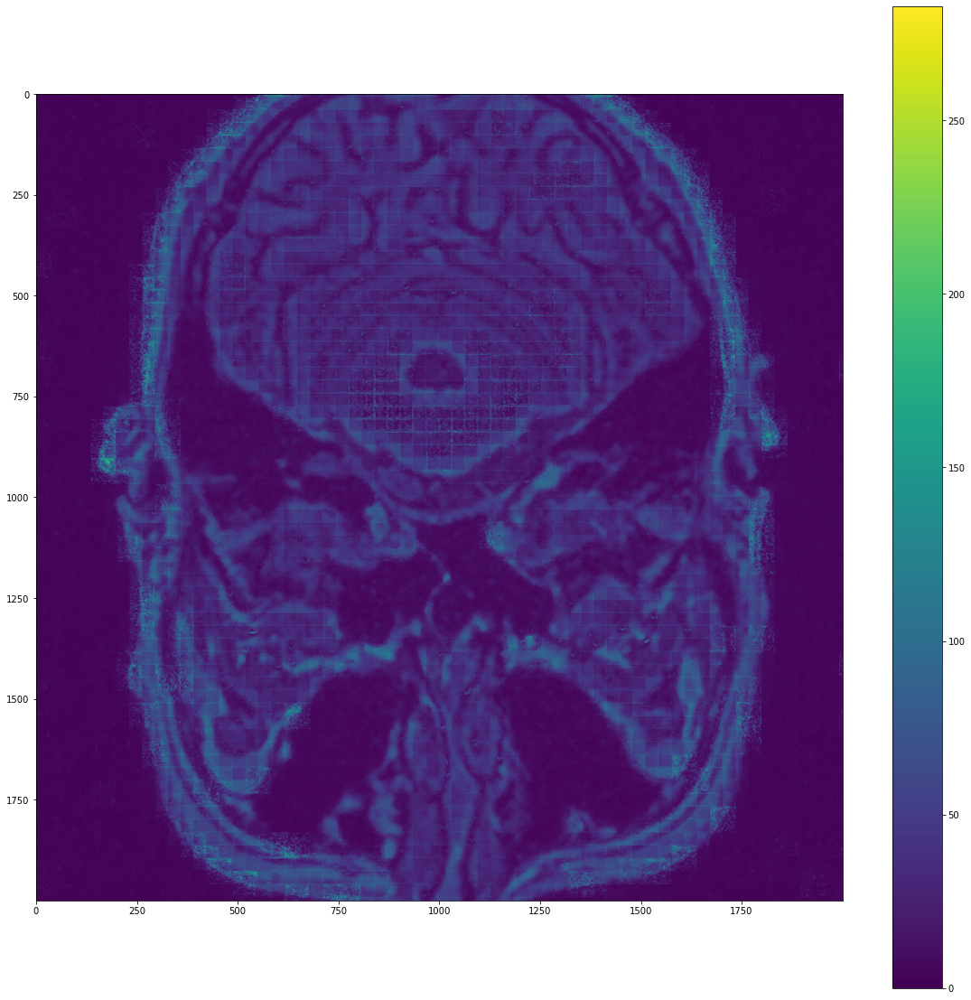

In [64]:
patchset = np.load('set.npy')
print(patchset.shape)
pred = unpatchify(patchset,64,64,32,32,goback=0)
plt.figure(figsize=(20,20))
plt.imshow(pred[1281-1000:1281+1000,1281-1000:1281+1000])
plt.colorbar()
plt.imsave('new_image_pred.jpg',pred)
np.save('new_image_pred.npy',pred)

(2497, 2497, 64, 64)


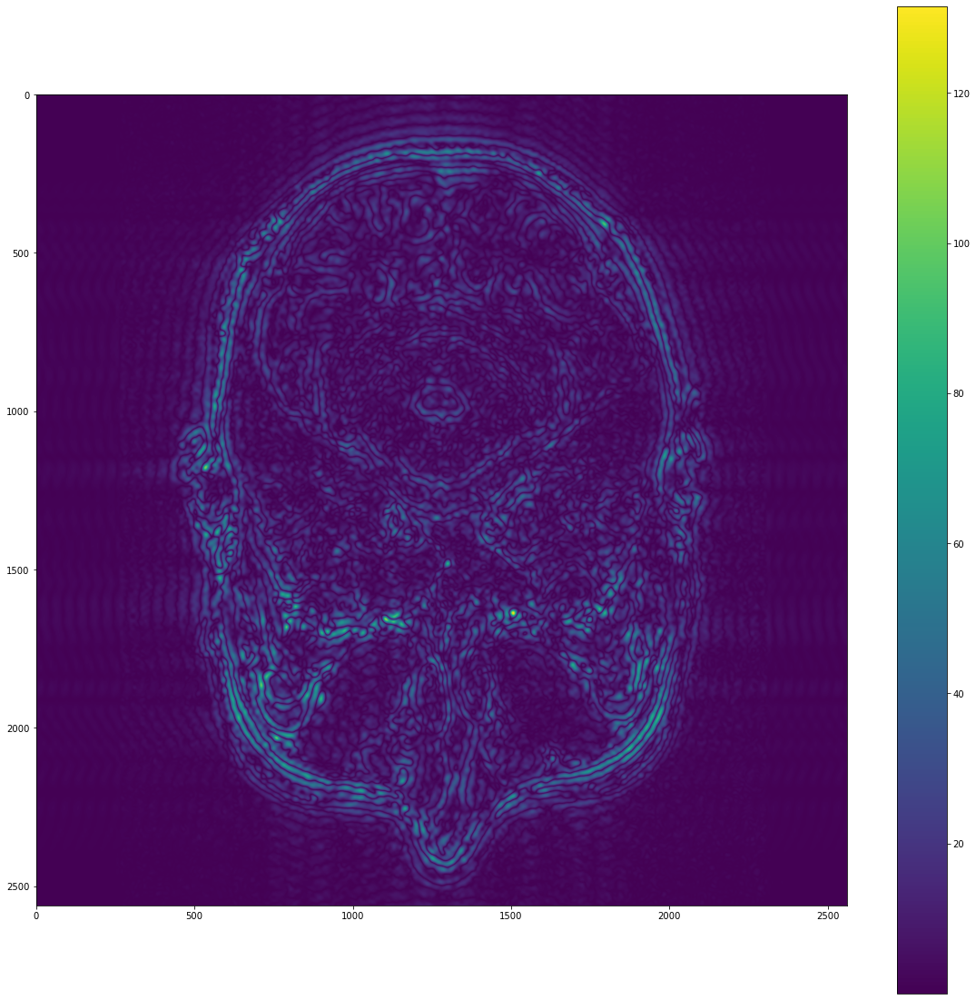

In [21]:
img = np.load('./T2_data/new_edge.npy')
plt.figure(figsize=(20,20))
plt.imshow(abs(img))
plt.colorbar()

low_set=np.zeros((2560//64,2560//64,64,64),dtype=complex)
patch_set = patchify(img,(64,64))
print(patch_set.shape)

for j in range(patch_set.shape[0]//64):
    for k in range(patch_set.shape[1]//64):
        ind1 = 64*j
        ind2 = 64*k
        patch = patch_set[ind1,ind2,:]
        
        low_set[j,k,:,:] = patch
# path_high = './image/image_double_cart_64/real/high/%04d.npy'%i
# np.save(path_high,h_edge[:,:,0])
# path_low = './image/image_double_cart_64/real/low/%04d.npy'%i
# np.save(path_low,l_edge[:,:,0])

# path_high = './image/image_double_cart_64/imag/high/%04d.npy'%i
# np.save(path_high,h_edge[:,:,1])
# path_low = './image/image_double_cart_64/imag/low/%04d.npy'%i
# np.save(path_low,l_edge[:,:,1])
# print(i)

(40, 40, 64, 64)


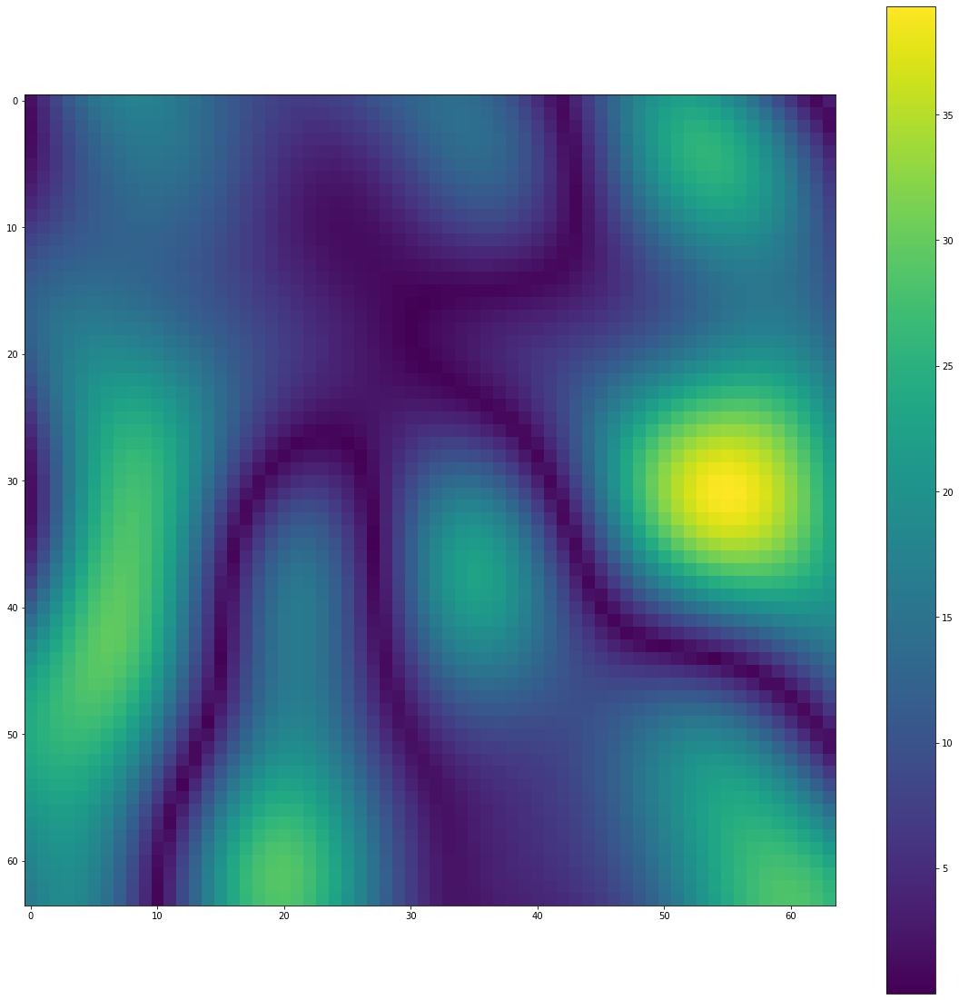

In [23]:
print(low_set.shape)
np.save('./edge_patchset.npy',low_set)
plt.figure(figsize=(20,20))
plt.imshow(abs(low_set[20,10,:,:]))
plt.colorbar()

In [ ]:
patch_size = (64,64)
training_amount = 50
final_amount = 100000
div1 = 10
div2 = 10
mini_div = 30
low_set = np.empty([final_amount,64,64], dtype = float)
high_set = np.empty([final_amount,64,64], dtype = float)

count = 0
    if count >= final_amount:
        break
    index = 500 + i*10
    read_path_high = "./image/image_origin/high/%04d.npy" %index
    read_path_low = "./image/image_origin/low/%04d.npy" %index
    
    high_img = np.load(read_path_high)
    low_img = np.load(read_path_low)
#     high_patches = np.squeeze(patchify(high_img,patch_size),axis=2)
#     low_patches = np.squeeze(patchify(low_img,patch_size),axis=2)
    high_patches = patchify(high_img,patch_size)
    low_patches = patchify(low_img,patch_size)

    
    for j in range(high_patches.shape[0]//div1):
        if count >= final_amount:
            break
        for k in range(high_patches.shape[1]//div2):
            ind1 = div1*j
            ind2 = div2*k
            high_patch = high_patches[ind1,ind2,:]
            low_patch = low_patches[ind1,ind2,:]
            if count >= final_amount:
                break
            if largest(high_patch)-smallest(high_patch) > mini_div and count < final_amount:
                high_set[count] = high_patch
                low_set[count] = low_patch
                count+=1
                
np.save("./npy/high_origin_img.npy", high_set)
np.save("./npy/low_origin_img.npy", low_set)
print(high_set.shape)